### 1. Import the data

In [1]:
import numpy as np
import pandas as pd


from sklearn.model_selection import (
    train_test_split,
    KFold,
    cross_val_score,
    StratifiedKFold
)


from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import MultinomialNB, GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import AdaBoostClassifier


from sklearn.metrics import (
    confusion_matrix, 
    accuracy_score,
    ConfusionMatrixDisplay,
    f1_score,
    roc_curve,
    auc
)


import matplotlib.pyplot as plt
import seaborn as sns


D:\1.Installing\Anaconda\lib\site-packages\scipy\__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.26.2
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [2]:
data = pd.read_csv("data_telco_customer_churn.csv")
data

,Dependents,tenure,OnlineSecurity,OnlineBackup,InternetService,DeviceProtection,TechSupport,Contract,PaperlessBilling,MonthlyCharges,Churn
0,Yes,9,No,No,DSL,Yes,Yes,Month-to-month,Yes,72.90,Yes
1,No,14,No,Yes,Fiber optic,Yes,No,Month-to-month,Yes,82.65,No
2,No,64,Yes,No,DSL,Yes,Yes,Two year,No,47.85,Yes
3,No,72,Yes,Yes,DSL,Yes,Yes,Two year,No,69.65,No
4,No,3,No internet service,No internet service,No,No internet service,No internet service,Month-to-month,Yes,23.60,No
...,...,...,...,...,...,...,...,...,...,...,...
4925,No,15,No,No,Fiber optic,Yes,Yes,Month-to-month,Yes,103.45,No
4926,Yes,10,No,No,Fiber optic,Yes,Yes,Month-to-month,Yes,91.10,No
4927,No,58,No internet service,No internet service,No,No internet service,No internet service,Two year,No,20.75,No
4928,No,1,No,No,Fiber optic,No,No,Month-to-month,Yes,69.75,Yes


### 2. Data Cleaning & Data Preparetion

In [4]:
# create dummy variables 

df = pd.DataFrame()

df["Dependents"] = [ 1 if x=="Yes" else 0 for x in data["Dependents"] ]
df["tenure"] = data["tenure"]
df["OnlineSecurity"] = [ 1 if x=="Yes" else 2 if x=="No internet service" else 0 for x in data["OnlineSecurity"] ]
df["OnlineBackup"] = [ 1 if x=="Yes" else 2 if x=="No internet service" else 0 for x in data["OnlineBackup"] ]
df["InternetService"] = [ 1 if x=="DSL" else 2 if x=="Fiber optic" else 0 for x in data["InternetService"] ]
df["DeviceProtection"] = [ 1 if x=="Yes" else 2 if x=="No internet service" else 0 for x in data["DeviceProtection"] ]
df["TechSupport"] = [ 1 if x=="Yes" else 2 if x=="No internet service" else 0 for x in data["TechSupport"] ]
df["Contract"] = [ 1 if x=="Month-to-month" else 2 if x=="Two year" else 0 for x in data["Contract"] ] 
# In this case, 0 stands for One year

df["PaperlessBilling"] = [ 1 if x=="Yes" else 0 for x in data["PaperlessBilling"] ]
df["MonthlyCharges"] = data["MonthlyCharges"]
df["Churn"] = [ 1 if x=="Yes" else 0 for x in data["Churn"] ]

df.head(5)

,Dependents,tenure,OnlineSecurity,OnlineBackup,InternetService,DeviceProtection,TechSupport,Contract,PaperlessBilling,MonthlyCharges,Churn
0,1,9,0,0,1,1,1,1,1,72.90,1
1,0,14,0,1,2,1,0,1,1,82.65,0
2,0,64,1,0,1,1,1,2,0,47.85,1
3,0,72,1,1,1,1,1,2,0,69.65,0
4,0,3,2,2,0,2,2,1,1,23.60,0


In [5]:
# Normalize "tenure" and "MonthlyCharges" columns —— (max - min) as denominater

df["tenure"] = (df["tenure"] - df["tenure"].min()) / (df["tenure"].max() - df["tenure"].min())
df["MonthlyCharges"] = (df["MonthlyCharges"] - df["MonthlyCharges"].min()) / (df["MonthlyCharges"].max() - df["MonthlyCharges"].min())

df.head(5)

,Dependents,tenure,OnlineSecurity,OnlineBackup,InternetService,DeviceProtection,TechSupport,Contract,PaperlessBilling,MonthlyCharges,Churn
0,1,0.125000,0,0,1,1,1,1,1,0.541813,1
1,0,0.194444,0,1,2,1,0,1,1,0.639459,0
2,0,0.888889,1,0,1,1,1,2,0,0.290936,1
3,0,1.000000,1,1,1,1,1,2,0,0.509264,0
4,0,0.041667,2,2,0,2,2,1,1,0.048072,0


D:\1.Installing\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='Churn', ylabel='count'>

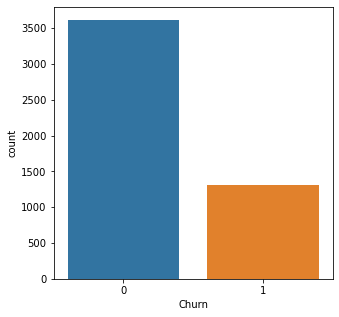

In [6]:
# Data Visualization

import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(5,5))
sns.countplot( df["Churn"] )

In [7]:
# Benchmark 2: Data Distribution / Proportion

cnt_yes = 0

for i in range( 0, df.shape[0] ):
    if df.loc[i, "Churn"] == 1:
        cnt_yes += 1


# Distribution for “Churn” 
prob_yes = cnt_yes / df.shape[0]
print(prob_yes)
print(1-prob_yes)

0.2669371196754564
0.7330628803245436


### 3. Classification Model Building

In this case, we need to use the supervised learning, and we decide to choose the following methods:
1. Logistic Regression 
2. Naive Bayes
3. Decision Tree

#### 3.1 Logistic Regression

0.783975659229209
F1 Score: 0.5782178217821782


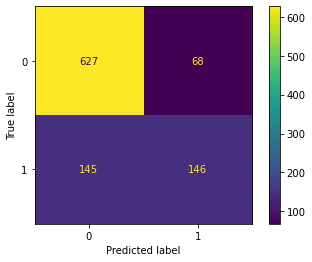

In [8]:
# make a copy of the dataset df
df_LR = df.copy()



# Drop the "PaperlessBilling" column so that it won't hurt our model
X = df_LR.drop(['Churn'], axis=1)
y = df_LR['Churn']



#Split in 80% training and 20% testing data set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)



# Applying Logistic Regression
logistic_model = LogisticRegression()
logistic_model.fit(X_train, y_train)

y_pred = logistic_model.predict(X_test)



# Confusion Matrix
labels = [0,1]

cm = confusion_matrix(y_test, y_pred)
graph1 = ConfusionMatrixDisplay( confusion_matrix = cm, display_labels = labels )
print( graph1.plot() )



# Accuracy
accuracy1 = accuracy_score(y_test, y_pred)
print(accuracy1)


# F1 Score
f1 = f1_score(y_test, y_pred)
print("F1 Score:", f1)

#### 3.2 Naive Bayes

0.7586206896551724
F1 Score: 0.6136363636363635


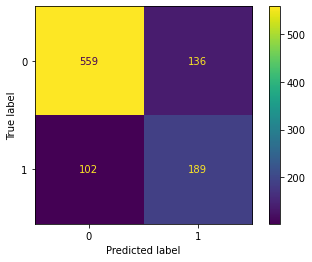

In [10]:
# make a copy of the dataset df
df_NB = df.copy()



# Split the DataFrame into training and testing sets
train_data, test_data = train_test_split(df_NB, test_size=0.2, random_state=42)



# Separate the target from the training data
y_train = train_data['Churn']
X_train = train_data.drop(['Churn'], axis=1)



# Separate the target from the testing data
y_test = test_data['Churn']
X_test = test_data.drop(['Churn'], axis=1)



# Instantiate the classifier
nb_classifier = MultinomialNB()

# Fit the classifier to the training data
nb_classifier.fit(X_train, y_train)

# Create the predicted tags
y_pred = nb_classifier.predict(X_test)



# Confusion Matrix
labels = [0,1]

cm = confusion_matrix(y_test, y_pred)
graph2 = ConfusionMatrixDisplay( confusion_matrix = cm, display_labels = labels )
print( graph2.plot() )



# Calculate the accuracy score: score
accuracy2 = accuracy_score(y_test, y_pred)
print(accuracy2)


# F1 Score
f1 = f1_score(y_test, y_pred)
print("F1 Score:", f1)

#### 3.3 Decision Tree

0.7281947261663286
F1 Score: 0.6136363636363635


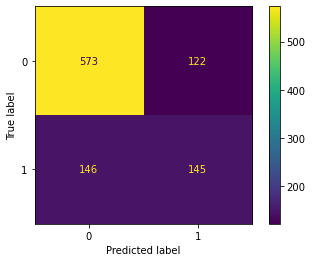

In [11]:
# make a copy of the dataset df
df_DT = df.copy()



# Split in 80% training and 20% testing set
train_data, test_data = train_test_split(df_DT, test_size=0.2, random_state=42)

# Separate features and target variable for training data
y_train = train_data['Churn']
X_train = train_data.drop(['Churn'], axis=1)

# Separate features and target variable for testing data
y_test = test_data['Churn']
X_test = test_data.drop(['Churn'], axis=1)



# Instantiate the classifier
dt_classifier = DecisionTreeClassifier(criterion = "entropy")

# Fit the classifier to the training data
dt_classifier.fit(X_train, y_train)

# Create the predicted tags
y_pred_3 = dt_classifier.predict(X_test)



# Confusion Matrix
labels = [0,1]

cm = confusion_matrix(y_test, y_pred_3)
graph3 = ConfusionMatrixDisplay( confusion_matrix = cm, display_labels = labels )
print( graph3.plot() )



# Calculate the accuracy score: score
accuracy3 = accuracy_score(y_test, y_pred_3)
print(accuracy3)


# F1 Score
f1 = f1_score(y_test, y_pred)
print("F1 Score:", f1)

In [45]:
# Plot the Decision Tree

# Features
features = [
    "Dependents",
    "tenure",
    "OnlineSecurity",
    "OnlineBackup",
    "InternetService",
    "DeviceProtection",
    "TechSupport",
    "Contracts",
    "PaperlessBilling",
    "MonthlyCharges",
]


# Plot the decision tree
plt.figure(figsize=(400,100))
tree.plot_tree(dt_classifier, feature_names=features, filled=True, rounded=True, fontsize=24)
plt.show()


### 4. Comparison

In [ ]:
# Benchmark 1: Accuracy without data pre-processing

# The accuracy of Logistic Regression is 0.78,
# The accuracy of Naive Bayes is 0.76,
# The accuracy of Decision Tree is 0.73,
# We decide to use the Logistic Regression because it gives us the highest accuracy score.


#### Cross Validation

In [13]:
# make a cppy of the data
df_CV = df.copy()


X = df_CV.drop(['Churn'], axis=1)
y = df_CV['Churn']



# Logistic Regression

# Create a 10-fold cross-validation object
kfold = KFold(n_splits=10, shuffle=True, random_state=42)

# Perform 10-fold cross-validation over the 3 models
cv_score = cross_val_score(logistic_model, X, y, cv=kfold)



# Print the accuracy for each fold
for i, accuracy in enumerate(cv_score):
    print(f"Fold {i+1}: { round(accuracy, 4) }")

    
# Print the average accuracy across all folds
print(f"Mean Accuracy: { round( cv_score.mean(), 4) }")


Fold 1: 0.7951
Fold 2: 0.7708
Fold 3: 0.8032
Fold 4: 0.787
Fold 5: 0.7708
Fold 6: 0.7972
Fold 7: 0.8012
Fold 8: 0.787
Fold 9: 0.8337
Fold 10: 0.8032
Mean Accuracy: 0.7949


In [15]:
# Naive Bayes

# Create a 10-fold cross-validation object
kfold = KFold(n_splits=10, shuffle=True, random_state=42)

# Perform 10-fold cross-validation over the 3 models
cv_score = cross_val_score(nb_classifier, X, y, cv=kfold)



# Print the accuracy for each fold
for i, accuracy in enumerate(cv_score):
    print(f"Fold {i+1}: { round(accuracy, 4) }")

    
# Print the average accuracy across all folds
print(f"Mean Accuracy: { round( cv_score.mean(), 4) }")


Fold 1: 0.7343
Fold 2: 0.7789
Fold 3: 0.7606
Fold 4: 0.7728
Fold 5: 0.7363
Fold 6: 0.7667
Fold 7: 0.7789
Fold 8: 0.7424
Fold 9: 0.7911
Fold 10: 0.7769
Mean Accuracy: 0.7639


In [17]:
# Decision Tree

# Create a 10-fold cross-validation object
kfold = KFold(n_splits=10, shuffle=True, random_state=42)

# Perform 10-fold cross-validation over the 3 models
cv_score = cross_val_score(dt_classifier, X, y, cv=kfold)



# Print the accuracy for each fold
for i, accuracy in enumerate(cv_score):
    print(f"Fold {i+1}: { round(accuracy, 4) }")

    
# Print the average accuracy across all folds
print(f"Mean Accuracy: { round( cv_score.mean(), 4) }")


Fold 1: 0.7099
Fold 2: 0.714
Fold 3: 0.7444
Fold 4: 0.7241
Fold 5: 0.7099
Fold 6: 0.714
Fold 7: 0.7424
Fold 8: 0.7424
Fold 9: 0.7383
Fold 10: 0.7627
Mean Accuracy: 0.7302


In [ ]:
# By comparing the mean accuracy using cross-validation,
# we can be certain that the Logistic Regression performs the best function in predicting the churn in this case


#### AUC-ROC

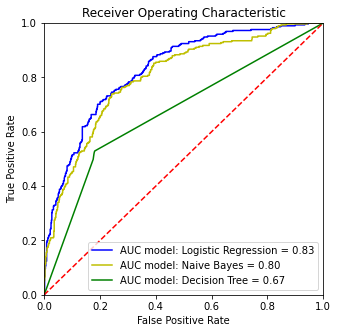

In [18]:
#Plot AUC-ROC


# Predict test set
pred1 = logistic_model.predict_proba(X_test)
pred2 = nb_classifier.predict_proba(X_test)
pred3 = dt_classifier.predict_proba(X_test)


false_positive_rate_1, true_positive_rate_1, thresholds_1 = roc_curve(y_test, pred1[:,1])   
# pred1[:,1] is True Positive, where the algorithm correctly implemented where churn was present and it predicted right
roc_auc_1 = auc(false_positive_rate_1, true_positive_rate_1)

false_positive_rate_2, true_positive_rate_2, thresholds_2 = roc_curve(y_test, pred2[:,1])
roc_auc_2 = auc(false_positive_rate_2, true_positive_rate_2)

false_positive_rate_3, true_positive_rate_3, thresholds_3 = roc_curve(y_test, pred3[:,1])
roc_auc_3 = auc(false_positive_rate_3, true_positive_rate_3)


    
plt.figure(figsize=(5,5))
plt.title('Receiver Operating Characteristic')
plt.plot(false_positive_rate_1, true_positive_rate_1, 'b', label = 'AUC model: Logistic Regression = %0.2f'  % roc_auc_1)
plt.plot(false_positive_rate_2, true_positive_rate_2, 'y', label = 'AUC model: Naive Bayes = %0.2f'  % roc_auc_2)
plt.plot(false_positive_rate_3, true_positive_rate_3, 'g', label = 'AUC model: Decision Tree = %0.2f' % roc_auc_3)

plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

In [ ]:
# By exploring the ROC curve, 
# the blue line, which is the Logistic Regression, performs the best.

### 2. Data Cleaning & Data pre-processing

### Improve Data Pre-processing
#### Reconsider about it, what else could have be done in the date pre-processing stage?
#### 【the above part 3 is kept cuz we want to compare the difference in accuracy before and after data pre-processing】

In [19]:
# check for missing value

null_cols = data.isnull().any()
null_cols

# no missing value

Dependents          False
tenure              False
OnlineSecurity      False
OnlineBackup        False
InternetService     False
DeviceProtection    False
TechSupport         False
Contract            False
PaperlessBilling    False
MonthlyCharges      False
Churn               False
dtype: bool

In [20]:
# Recall our df 
df.head(5)

,Dependents,tenure,OnlineSecurity,OnlineBackup,InternetService,DeviceProtection,TechSupport,Contract,PaperlessBilling,MonthlyCharges,Churn
0,1,0.125000,0,0,1,1,1,1,1,0.541813,1
1,0,0.194444,0,1,2,1,0,1,1,0.639459,0
2,0,0.888889,1,0,1,1,1,2,0,0.290936,1
3,0,1.000000,1,1,1,1,1,2,0,0.509264,0
4,0,0.041667,2,2,0,2,2,1,1,0.048072,0


<AxesSubplot:>

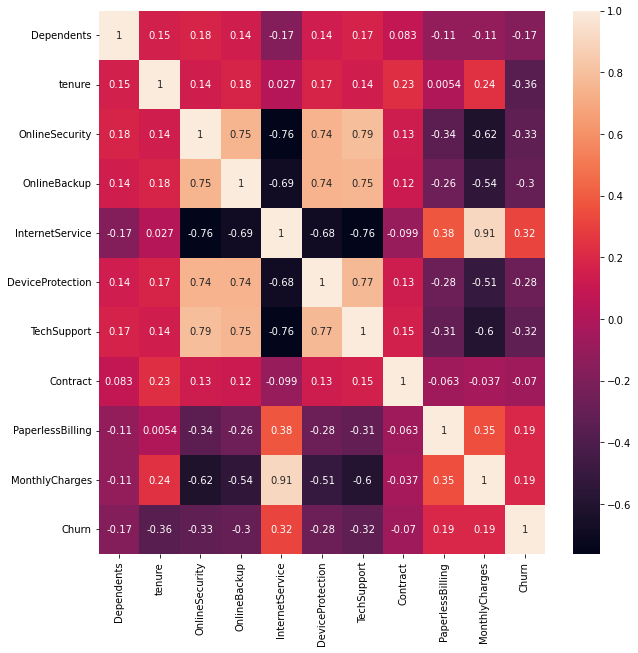

In [21]:
# Check for corr

plt.figure(figsize=(10, 10))
corr = df.corr()
sns.heatmap(corr, annot=True)

# New Finding: almost all the correlation coefficient varies from 0.1-0.3,
# there's only one feature, which is the "Contract", has a corr coefficient of 0.07,
# So, this time, we would like to see if there's any change caused by dropping this feature.


### A. Variable Selection

### 3. Classification Model Building

In [22]:
# define a function that can plot the confusion matrix with annotation, 
# and looks better than default color

def plot_confusionmatrix(y_train_pred,y_train,dom):
    print(f'{dom} Confusion matrix')
    classes = ["Churn", "NOT Churn"]
    cf = confusion_matrix(y_train_pred,y_train)
    sns.heatmap(cf,annot=True,yticklabels=classes,xticklabels=classes,cmap='Blues', fmt='g')
    # When annot is set to True, it adds text annotations to each cell of the heatmap.
    plt.tight_layout()
    plt.show()

#### 3.1 Logistic Regression

Test Confusion matrix


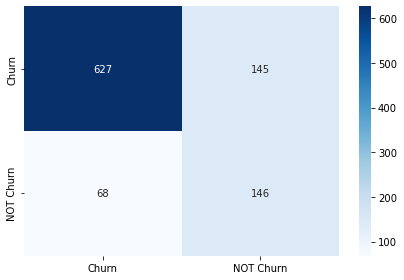

0.783975659229209
F1 Score: 0.5782178217821782


In [24]:
# make a copy of the dataset df
df_LR = df.copy()



# Drop the "PaperlessBilling" column so that it won't hurt our model
X = df_LR.drop(['Churn', 'Contract'], axis=1)
y = df_LR['Churn']



#Split in 80% training and 20% testing data set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)



# Applying Logistic Regression
logistic_model = LogisticRegression()
logistic_model.fit(X_train, y_train)

y_pred = logistic_model.predict(X_test)



# Confusion Matrix
plot_confusionmatrix(y_pred,y_test,dom='Test')


# Accuracy
accuracy4 = accuracy_score(y_test, y_pred)
print(accuracy4)


# F1 Score
f1 = f1_score(y_test, y_pred)
print("F1 Score:", f1)

#### 3.2 Naive Bayes

Test Confusion matrix


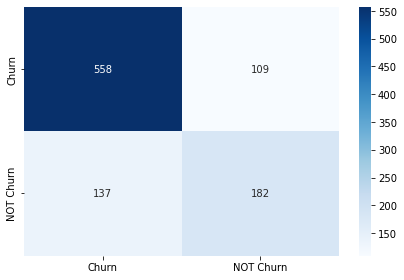

0.7505070993914807
F1 Score: 0.5967213114754099


In [25]:
# make a copy of the dataset df
df_NB = df.copy()



# Split the DataFrame into training and testing sets
train_data, test_data = train_test_split(df_NB, test_size=0.2, random_state=42)



# Separate the target from the training data
y_train = train_data['Churn']
X_train = train_data.drop(['Churn', 'Contract'], axis=1)



# Separate the target from the testing data
y_test = test_data['Churn']
X_test = test_data.drop(['Churn', 'Contract'], axis=1)



# Instantiate the classifier
nb_classifier = MultinomialNB()

# Fit the classifier to the training data
nb_classifier.fit(X_train, y_train)

# Create the predicted tags
y_pred = nb_classifier.predict(X_test)



# Confusion Matrix
plot_confusionmatrix(y_pred,y_test,dom='Test')



# Calculate the accuracy score: score
accuracy5 = accuracy_score(y_test, y_pred)
print(accuracy5)


# F1 Score
f1 = f1_score(y_test, y_pred)
print("F1 Score:", f1)

#### 3.3 Decision Tree

In [29]:
# Pre pruning technique

from sklearn.model_selection import GridSearchCV

params = {'max_depth': [2,4,6,8,10,12],
         'min_samples_split': [2,3,4],
         'min_samples_leaf': [1,2]}

clf = tree.DecisionTreeClassifier()
gcv = GridSearchCV(estimator=clf,param_grid=params)
gcv.fit(X_train,y_train)


model = gcv.best_estimator_
print("Best Fit Model")
print(model)


# 【Notice:】  By using the max_depth=4, 
# it also improves the accuracy of our model by 7%  (0.71 --> 0.78)

Best Fit Model
DecisionTreeClassifier(max_depth=4)


Test Confusion matrix


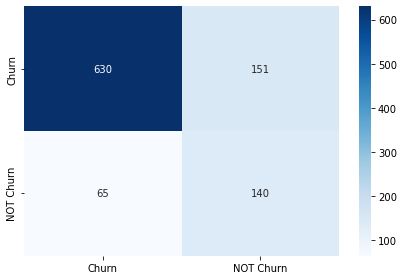

0.7809330628803245
F1 Score: 0.5645161290322581


In [41]:
# make a copy of the dataset df
df_DT = df.copy()



# Split in 80% training and 20% testing set
train_data, test_data = train_test_split(df_DT, test_size=0.2, random_state=42)

# Separate features and target variable for training data
y_train = train_data['Churn']
X_train = train_data.drop(['Churn', 'Contract'], axis=1)

# Separate features and target variable for testing data
y_test = test_data['Churn']
X_test = test_data.drop(['Churn', 'Contract'], axis=1)



# Instantiate the classifier
dt_classifier = DecisionTreeClassifier(criterion = "entropy", max_depth=4)

# Fit the classifier to the training data
dt_classifier.fit(X_train, y_train)

# Create the predicted tags
y_pred = dt_classifier.predict(X_test)



# Confusion Matrix
plot_confusionmatrix(y_pred,y_test,dom='Test')



# Calculate the accuracy score: score
accuracy6 = accuracy_score(y_test, y_pred)
print(accuracy6)


# F1 Score
f1 = f1_score(y_test, y_pred)
print("F1 Score:", f1)

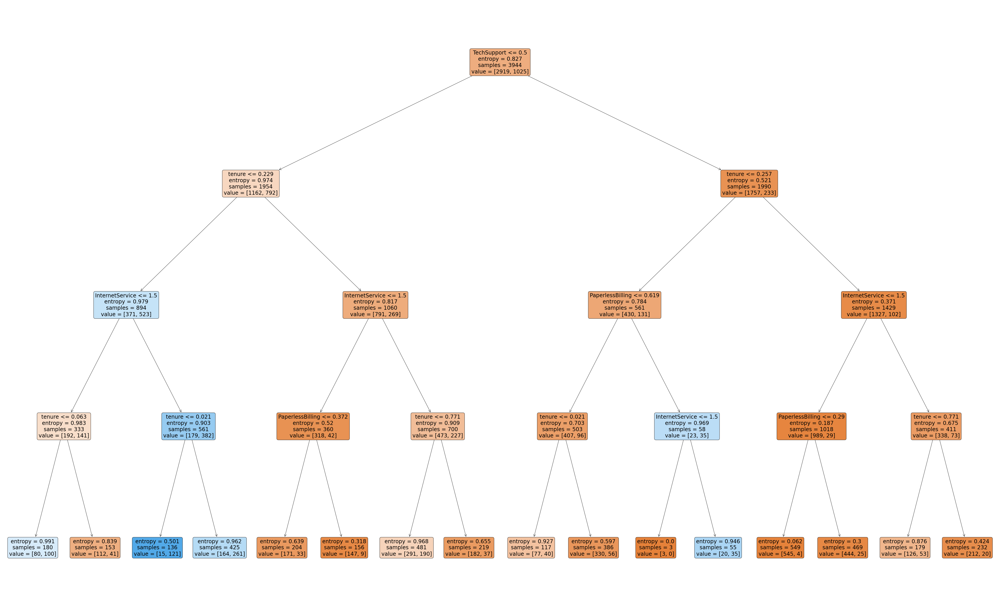

In [42]:
# Plot the Decision Tree

# Features
features = [
    "Dependents",
    "tenure",
    "OnlineSecurity",
    "OnlineBackup",
    "InternetService",
    "DeviceProtection",
    "TechSupport",
    "Contracts",
    "PaperlessBilling",
    "MonthlyCharges",
]


# Plot the decision tree
plt.figure(figsize=(80,50))
tree.plot_tree(dt_classifier, feature_names=features, filled=True, rounded=True, fontsize=24)
plt.show()


### 4.Comparison

#### The accuracy of Logistic Regression is 0.7839,
#### The accuracy of Naive Bayes is 0.75,
#### The accuracy of Decision Tree is 0.7809,
#### Logistic Regression gives us the highest accuracy score.


It's because logistic regression take every data point into account, so every feature matters.
If we get rid of the ones which are not necessarily correlated to the dependent variable "Churn",
the prediction result will be more accurate.


【PS: the accuracy score of Decision Tree model was 0.71 original,
but it improves by 7% by choosing the best parameter using GridSearchVS method.
It makes sense that DT and LR have similar accuracy scores because DT is a type of conversion of LR.】



#### The result doesn't change too much compared to the models before data pre-processing because our original dataset is pretty good and neat at first.

#### 【Notice】: This is not the end of comparison!!
#### Except for comparing the overall accuracy socres of the 3 models,
#### we also need to compare the stratified accuracy,
#### 10-Fold Cross Validation & ROC curve will be tested in the following:

#### Cross Validation

In [43]:
# make a cppy of the data
df_CV = df.copy()


X = df_CV.drop(['Churn','Contract'], axis=1)
y = df_CV['Churn']



# Logistic Regression

# Create a 10-fold cross-validation object
kfold = KFold(n_splits=10, shuffle=True, random_state=42)

# Perform 10-fold cross-validation over the 3 models
cv_score = cross_val_score(logistic_model, X, y, cv=kfold)



# Print the accuracy for each fold
for i, accuracy in enumerate(cv_score):
    print(f"Fold {i+1}: { round(accuracy, 4) }")

    
# Print the average accuracy across all folds
print(f"Mean Accuracy: { round( cv_score.mean(), 4) }")


Fold 1: 0.7951
Fold 2: 0.7708
Fold 3: 0.8053
Fold 4: 0.787
Fold 5: 0.7688
Fold 6: 0.7972
Fold 7: 0.8012
Fold 8: 0.787
Fold 9: 0.8337
Fold 10: 0.8012
Mean Accuracy: 0.7947


In [44]:
# Naive Bayes

# Create a 10-fold cross-validation object
kfold = KFold(n_splits=10, shuffle=True, random_state=42)

# Perform 10-fold cross-validation over the 3 models
cv_score = cross_val_score(nb_classifier, X, y, cv=kfold)



# Print the accuracy for each fold
for i, accuracy in enumerate(cv_score):
    print(f"Fold {i+1}: { round(accuracy, 4) }")

    
# Print the average accuracy across all folds
print(f"Mean Accuracy: { round( cv_score.mean(), 4) }")


Fold 1: 0.7302
Fold 2: 0.7708
Fold 3: 0.7525
Fold 4: 0.7647
Fold 5: 0.7282
Fold 6: 0.7627
Fold 7: 0.7769
Fold 8: 0.7485
Fold 9: 0.7911
Fold 10: 0.7769
Mean Accuracy: 0.7602


In [45]:
# Decision Tree

# Create a 10-fold cross-validation object
kfold = KFold(n_splits=10, shuffle=True, random_state=42)

# Perform 10-fold cross-validation over the 3 models
cv_score = cross_val_score(dt_classifier, X, y, cv=kfold)



# Print the accuracy for each fold
for i, accuracy in enumerate(cv_score):
    print(f"Fold {i+1}: { round(accuracy, 4) }")

    
# Print the average accuracy across all folds
print(f"Mean Accuracy: { round( cv_score.mean(), 4) }")


Fold 1: 0.7931
Fold 2: 0.787
Fold 3: 0.8012
Fold 4: 0.7748
Fold 5: 0.7566
Fold 6: 0.7789
Fold 7: 0.8073
Fold 8: 0.8195
Fold 9: 0.8316
Fold 10: 0.8032
Mean Accuracy: 0.7953


In [ ]:
# By comparing the mean accuracy from cross-validation for the 3 different models,
# Logistic Regression and Decision Tree both works pretty good at a similar level.


#### AUC-ROC

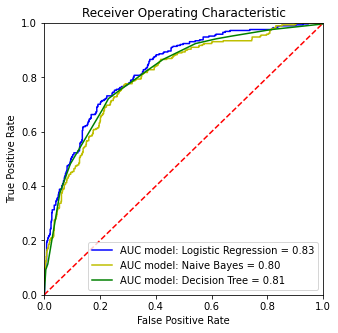

In [46]:
#Plot AUC-ROC


# Predict test set
pred4 = logistic_model.predict_proba(X_test)
pred5 = nb_classifier.predict_proba(X_test)
pred6 = dt_classifier.predict_proba(X_test)


false_positive_rate_1, true_positive_rate_1, thresholds_1 = roc_curve(y_test, pred4[:,1])   
# pred1[:,1] is True Positive, where the algorithm correctly implemented where churn was present and it predicted right
roc_auc_1 = auc(false_positive_rate_1, true_positive_rate_1)

false_positive_rate_2, true_positive_rate_2, thresholds_2 = roc_curve(y_test, pred5[:,1])
roc_auc_2 = auc(false_positive_rate_2, true_positive_rate_2)

false_positive_rate_3, true_positive_rate_3, thresholds_3 = roc_curve(y_test, pred6[:,1])
roc_auc_3 = auc(false_positive_rate_3, true_positive_rate_3)


    
plt.figure(figsize=(5,5))
plt.title('Receiver Operating Characteristic')
plt.plot(false_positive_rate_1, true_positive_rate_1, 'b', label = 'AUC model: Logistic Regression = %0.2f'  % roc_auc_1)
plt.plot(false_positive_rate_2, true_positive_rate_2, 'y', label = 'AUC model: Naive Bayes = %0.2f'  % roc_auc_2)
plt.plot(false_positive_rate_3, true_positive_rate_3, 'g', label = 'AUC model: Decision Tree = %0.2f' % roc_auc_3)

plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

In [ ]:
# By observing the ROC curve, 
# the blue line, which is the Logistic Regression, performs the best.

### A. In conclusion, Variable Selection (droping the "Contract" feature) doesn't help in improving our models.

### B. SMOTE Resampling

### 3. Classification Model Building

In [49]:
from imblearn.over_sampling import SMOTE

# make a copy of the df
df_copy = df.copy()

# define the indep. and dep.variables y and X
y = df_copy["Churn"]
X = df_copy.drop( ["Churn"], axis=1 )


# Create an instance of the SMOTE class
smote = SMOTE(sampling_strategy=0.66, random_state=42)


# Create an instance of the SMOTE class
X_resampled, y_resampled = smote.fit_resample(X, y)


In [54]:
# Report the distribution of resampled data

cnt_churn = sum( df["Churn"] )
prob_churn = cnt_churn / df.shape[0]
print(prob_churn)

prob_not_churn = 1 - prob_churn
print(prob_not_churn)


0.2669371196754564
0.7330628803245436


#### 3.1 Logistic Regression

Test Confusion matrix


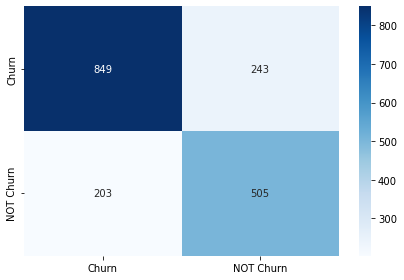

0.7522222222222222
F1 Score: 0.6936813186813187


In [67]:
# Split in 70% training and 30% testing set
X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.3, random_state=42)


# Applying Logistic Regression
model_1 = LogisticRegression(C=0.1, penalty='l1', solver='saga', max_iter=1000)
model_1.fit(X_train, y_train)

y_pred = model_1.predict(X_test)



# Confusion Matrix
plot_confusionmatrix(y_pred,y_test,dom='Test')


# Accuracy
accuracy7 = accuracy_score(y_test, y_pred)
print(accuracy7)


# F1 Score
f1 = f1_score(y_test, y_pred)
print("F1 Score:", f1)

#### 3.2 Naive Bayes

Test Confusion matrix


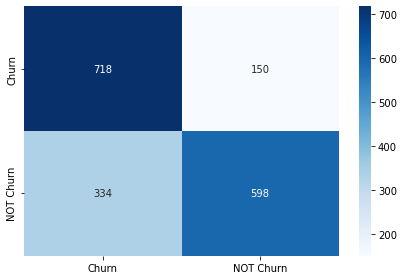

0.7311111111111112
F1 Score: 0.7119047619047619


In [70]:
# Split in 70% training and 30% testing set
X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.3, random_state=42)


# Applying Naive Bayes
model_2 = MultinomialNB(alpha=1.0)

# Fit the classifier to the training data
model_2.fit(X_train, y_train)

# Create the predicted tags
y_pred = model_2.predict(X_test)



# Confusion Matrix
plot_confusionmatrix(y_pred,y_test,dom='Test')



# Calculate the accuracy score: score
accuracy8 = accuracy_score(y_test, y_pred)
print(accuracy8)


# F1 Score
f1 = f1_score(y_test, y_pred)
print("F1 Score:", f1)

#### 3.3 Decision Tree

Test Confusion matrix


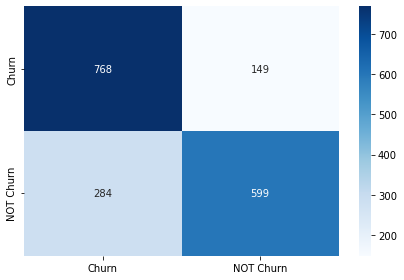

0.7594444444444445
F1 Score: 0.7345187001839362


In [71]:
# Split in 70% training and 30% testing set
X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.3, random_state=42)


# Applying Decision Tree
model_3 = DecisionTreeClassifier(criterion = "entropy", max_depth=4)
model_3.fit(X_train, y_train)

# Create the predicted tags
y_pred = model_3.predict(X_test)



# Confusion Matrix
plot_confusionmatrix(y_pred,y_test,dom='Test')



# Calculate the accuracy score: score
accuracy9 = accuracy_score(y_test, y_pred)
print(accuracy9)


# F1 Score
f1 = f1_score(y_test, y_pred)
print("F1 Score:", f1)

### 4. Comparison

In [72]:
# make a cppy of the data
df_CV = df.copy()


X = df_CV.drop(['Churn'], axis=1)
y = df_CV['Churn']



# Logistic Regression

# Create a 10-fold cross-validation object
kfold = KFold(n_splits=10, shuffle=True, random_state=42)

# Perform 10-fold cross-validation over the 3 models
cv_score = cross_val_score(model_1, X, y, cv=kfold)



# Print the accuracy for each fold
for i, accuracy in enumerate(cv_score):
    print(f"Fold {i+1}: { round(accuracy, 4) }")

    
# Print the average accuracy across all folds
print(f"Mean Accuracy: { round( cv_score.mean(), 4) }")


Fold 1: 0.7951
Fold 2: 0.7688
Fold 3: 0.8053
Fold 4: 0.789
Fold 5: 0.7688
Fold 6: 0.7911
Fold 7: 0.7992
Fold 8: 0.789
Fold 9: 0.8316
Fold 10: 0.8114
Mean Accuracy: 0.7949


In [73]:
# Naive Bayes

# Create a 10-fold cross-validation object
kfold = KFold(n_splits=10, shuffle=True, random_state=42)

# Perform 10-fold cross-validation over the 3 models
cv_score = cross_val_score(model_2, X, y, cv=kfold)



# Print the accuracy for each fold
for i, accuracy in enumerate(cv_score):
    print(f"Fold {i+1}: { round(accuracy, 4) }")

    
# Print the average accuracy across all folds
print(f"Mean Accuracy: { round( cv_score.mean(), 4) }")


Fold 1: 0.7343
Fold 2: 0.7789
Fold 3: 0.7606
Fold 4: 0.7728
Fold 5: 0.7363
Fold 6: 0.7667
Fold 7: 0.7789
Fold 8: 0.7424
Fold 9: 0.7911
Fold 10: 0.7769
Mean Accuracy: 0.7639


In [74]:
# Decision Tree

# Create a 10-fold cross-validation object
kfold = KFold(n_splits=10, shuffle=True, random_state=42)

# Perform 10-fold cross-validation over the 3 models
cv_score = cross_val_score(model_3, X, y, cv=kfold)



# Print the accuracy for each fold
for i, accuracy in enumerate(cv_score):
    print(f"Fold {i+1}: { round(accuracy, 4) }")

    
# Print the average accuracy across all folds
print(f"Mean Accuracy: { round( cv_score.mean(), 4) }")


Fold 1: 0.789
Fold 2: 0.7728
Fold 3: 0.7992
Fold 4: 0.7708
Fold 5: 0.7728
Fold 6: 0.7769
Fold 7: 0.8032
Fold 8: 0.8012
Fold 9: 0.8256
Fold 10: 0.8032
Mean Accuracy: 0.7915


#### AUC-ROC

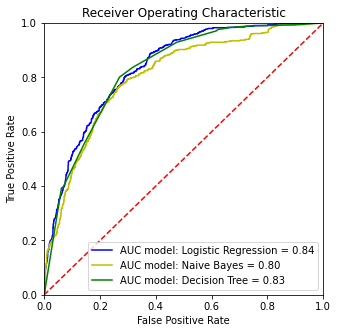

In [75]:
#Plot AUC-ROC


# Predict test set
pred7 = model_1.predict_proba(X_test)
pred8 = model_2.predict_proba(X_test)
pred9 = model_3.predict_proba(X_test)


false_positive_rate_1, true_positive_rate_1, thresholds_1 = roc_curve(y_test, pred7[:,1])   
# pred1[:,1] is True Positive, where the algorithm correctly implemented where churn was present and it predicted right
roc_auc_1 = auc(false_positive_rate_1, true_positive_rate_1)

false_positive_rate_2, true_positive_rate_2, thresholds_2 = roc_curve(y_test, pred8[:,1])
roc_auc_2 = auc(false_positive_rate_2, true_positive_rate_2)

false_positive_rate_3, true_positive_rate_3, thresholds_3 = roc_curve(y_test, pred9[:,1])
roc_auc_3 = auc(false_positive_rate_3, true_positive_rate_3)


    
plt.figure(figsize=(5,5))
plt.title('Receiver Operating Characteristic')
plt.plot(false_positive_rate_1, true_positive_rate_1, 'b', label = 'AUC model: Logistic Regression = %0.2f'  % roc_auc_1)
plt.plot(false_positive_rate_2, true_positive_rate_2, 'y', label = 'AUC model: Naive Bayes = %0.2f'  % roc_auc_2)
plt.plot(false_positive_rate_3, true_positive_rate_3, 'g', label = 'AUC model: Decision Tree = %0.2f' % roc_auc_3)

plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

### C. SMOTE + Boosting

### 3. Classification Model Building

In [79]:
from imblearn.over_sampling import SMOTE

# make a copy of the df
df_copy2 = df.copy()

# define the indep. and dep.variables y and X
y = df_copy2["Churn"]
X = df_copy2.drop( ["Churn"], axis=1 )


# Create an instance of the SMOTE class
smote = SMOTE(sampling_strategy=0.66, random_state=42)


# Create an instance of the SMOTE class
X_resampled, y_resampled = smote.fit_resample(X, y)


#### 3.1 Logistic Regression

Test Confusion matrix


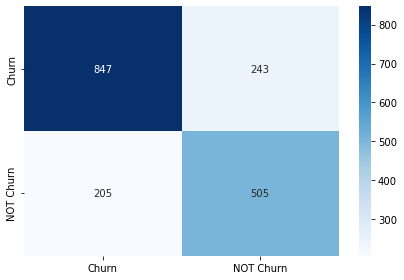

Accuracy (Boosted): 0.7511111111111111
F1 Score (Boosted): 0.6927297668038409


In [108]:
# Split in 70% training and 30% testing set
X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.3, random_state=42)


from sklearn.ensemble import AdaBoostClassifier

# Applying AdaBoost with Logistic Regression as the base estimator
base_model_1 = LogisticRegression()
boosted_model_1 = AdaBoostClassifier(base_model_1, n_estimators=50, random_state=42)

# Fit the model to the training data
boosted_model_1.fit(X_train, y_train)

# Predictions
y_pred = boosted_model_1.predict(X_test)


# Confusion Matrix
plot_confusionmatrix(y_pred, y_test, dom='Test')


# Accuracy
accuracy_boosted = accuracy_score(y_test, y_pred)
print("Accuracy (Boosted):", accuracy_boosted)

# F1 Score
f1_boosted = f1_score(y_test, y_pred)
print("F1 Score (Boosted):", f1_boosted)

#### 3.2 Naive Bayes

Test Confusion matrix


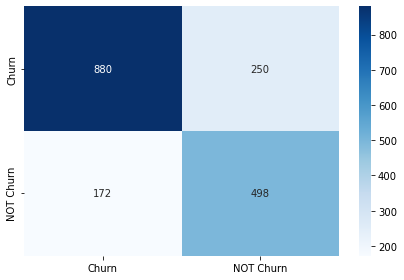

Accuracy (Boosted): 0.7655555555555555
F1 Score (Boosted): 0.7023977433004231


In [94]:
# Split in 70% training and 30% testing set
X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.3, random_state=42)


from sklearn.ensemble import AdaBoostClassifier

# Applying AdaBoost with Logistic Regression as the base estimator
base_model_2 = MultinomialNB(alpha=1.0)
boosted_model_2 = AdaBoostClassifier(base_model_2, n_estimators=200, random_state=42, learning_rate=0.2)

# Fit the model to the training data
boosted_model_2.fit(X_train, y_train)

# Predictions
y_pred = boosted_model_2.predict(X_test)

# Confusion Matrix
plot_confusionmatrix(y_pred, y_test, dom='Test')


# Accuracy
accuracy_boosted = accuracy_score(y_test, y_pred)
print("Accuracy (Boosted):", accuracy_boosted)

# F1 Score
f1_boosted = f1_score(y_test, y_pred)
print("F1 Score (Boosted):", f1_boosted)

#### 3.3 Decision Tree

Test Confusion matrix


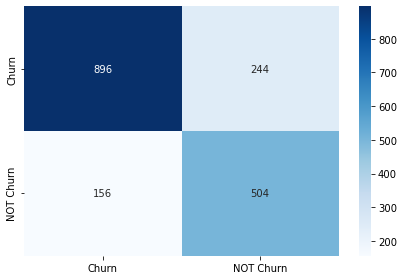

Accuracy (Boosted): 0.7777777777777778
F1 Score (Boosted): 0.7159090909090909


In [98]:
# Split in 70% training and 30% testing set
X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.3, random_state=42)


from sklearn.ensemble import AdaBoostClassifier

# Applying AdaBoost with Logistic Regression as the base estimator
base_model_3 = DecisionTreeClassifier(criterion = "entropy", max_depth=4)
boosted_model_3 = AdaBoostClassifier(base_model_3, n_estimators=200, random_state=42, learning_rate=0.2)

# Fit the model to the training data
boosted_model_3.fit(X_train, y_train)

# Predictions
y_pred = boosted_model_3.predict(X_test)

# Confusion Matrix
plot_confusionmatrix(y_pred, y_test, dom='Test')


# Accuracy
accuracy_boosted = accuracy_score(y_test, y_pred)
print("Accuracy (Boosted):", accuracy_boosted)

# F1 Score
f1_boosted = f1_score(y_test, y_pred)
print("F1 Score (Boosted):", f1_boosted)


### 4. Comparison

In [109]:
# make a cppy of the data
df_CV2 = df.copy()


X = df_CV2.drop(['Churn'], axis=1)
y = df_CV2['Churn']



# Logistic Regression

# Create a 10-fold cross-validation object
kfold = KFold(n_splits=10, shuffle=True, random_state=42)

# Perform 10-fold cross-validation over the 3 models
cv_score = cross_val_score(boosted_model_1, X, y, cv=kfold)



# Print the accuracy for each fold
for i, accuracy in enumerate(cv_score):
    print(f"Fold {i+1}: { round(accuracy, 4) }")

    
# Print the average accuracy across all folds
print(f"Mean Accuracy: { round( cv_score.mean(), 4) }")


Fold 1: 0.7789
Fold 2: 0.7688
Fold 3: 0.7951
Fold 4: 0.7688
Fold 5: 0.7606
Fold 6: 0.789
Fold 7: 0.8012
Fold 8: 0.7972
Fold 9: 0.8276
Fold 10: 0.8215
Mean Accuracy: 0.7909


In [100]:
# Naive Bayes

# Create a 10-fold cross-validation object
kfold = KFold(n_splits=10, shuffle=True, random_state=42)

# Perform 10-fold cross-validation over the 3 models
cv_score = cross_val_score(boosted_model_2, X, y, cv=kfold)



# Print the accuracy for each fold
for i, accuracy in enumerate(cv_score):
    print(f"Fold {i+1}: { round(accuracy, 4) }")

    
# Print the average accuracy across all folds
print(f"Mean Accuracy: { round( cv_score.mean(), 4) }")

Fold 1: 0.7972
Fold 2: 0.7667
Fold 3: 0.7972
Fold 4: 0.7708
Fold 5: 0.7586
Fold 6: 0.7911
Fold 7: 0.783
Fold 8: 0.7951
Fold 9: 0.8398
Fold 10: 0.7972
Mean Accuracy: 0.7897


In [101]:
# Decision Tree

# Create a 10-fold cross-validation object
kfold = KFold(n_splits=10, shuffle=True, random_state=42)

# Perform 10-fold cross-validation over the 3 models
cv_score = cross_val_score(boosted_model_3, X, y, cv=kfold)



# Print the accuracy for each fold
for i, accuracy in enumerate(cv_score):
    print(f"Fold {i+1}: { round(accuracy, 4) }")

    
# Print the average accuracy across all folds
print(f"Mean Accuracy: { round( cv_score.mean(), 4) }")

Fold 1: 0.7302
Fold 2: 0.785
Fold 3: 0.7343
Fold 4: 0.7424
Fold 5: 0.7363
Fold 6: 0.7323
Fold 7: 0.7606
Fold 8: 0.7769
Fold 9: 0.7931
Fold 10: 0.7748
Mean Accuracy: 0.7566


#### AUC-ROC

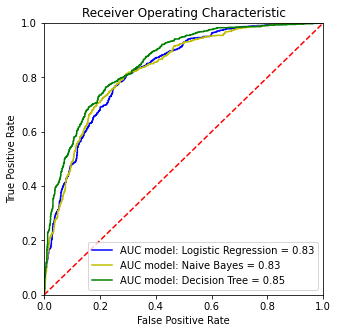

In [110]:
#Plot AUC-ROC


# Predict test set
pred10 = boosted_model_1.predict_proba(X_test)
pred11 = boosted_model_2.predict_proba(X_test)
pred12 = boosted_model_3.predict_proba(X_test)


false_positive_rate_1, true_positive_rate_1, thresholds_1 = roc_curve(y_test, pred10[:,1])   
# pred1[:,1] is True Positive, where the algorithm correctly implemented where churn was present and it predicted right
roc_auc_1 = auc(false_positive_rate_1, true_positive_rate_1)

false_positive_rate_2, true_positive_rate_2, thresholds_2 = roc_curve(y_test, pred11[:,1])
roc_auc_2 = auc(false_positive_rate_2, true_positive_rate_2)

false_positive_rate_3, true_positive_rate_3, thresholds_3 = roc_curve(y_test, pred12[:,1])
roc_auc_3 = auc(false_positive_rate_3, true_positive_rate_3)


    
plt.figure(figsize=(5,5))
plt.title('Receiver Operating Characteristic')
plt.plot(false_positive_rate_1, true_positive_rate_1, 'b', label = 'AUC model: Logistic Regression = %0.2f'  % roc_auc_1)
plt.plot(false_positive_rate_2, true_positive_rate_2, 'y', label = 'AUC model: Naive Bayes = %0.2f'  % roc_auc_2)
plt.plot(false_positive_rate_3, true_positive_rate_3, 'g', label = 'AUC model: Decision Tree = %0.2f' % roc_auc_3)

plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()